#  Background:

The startup is one of the fastest growing startups in the logistics and delivery domain. 

They work with several partners and make on-demand delivery to customers. 

During the COVID-19 pandemic, the startup is facing several different challenges
and everyday they are trying to address these challenges.

One of the main objectives of the company is to make their customers happy. As a growing startup, 
with a global expansion strategy they are conscient that they need to make their customers happy 
and the only way to do that is to measure how happy each customer is.

Based on prediction of customer happiness, it is possible and easier to take necessary actions
to assure the growth of the company.

Getting feedback from customers is not easy either. In fact, this is a crucial function to improve operations across all levels.

Recently, a survey to a select customer cohort has been conducted. 

We are provided a subset of customer satsifaction, and we will use this 
data to make predictions based on machine learning models.

# Summary 

In this section, please find the different steps that we will follow
during this notebook in order to perform feature selection,
hyperparameter tunning and model prediction. 

## A - Data Exploration.

## B - Classifiers (Machine Learning models) and Hyperparameters Tuning.
        * 1. Random Forest Classifier
        * 2. Gradient Boosting Classifier
        * 3. XGBoost Classifier
        * 4. LightGBM Classifier
        * 5. Hyperparameter Tunning
        * 6. Randomized Search Technique
        
        
## C - Feature Selection based on Statistical Tests and Prediction based on Classifiers.
        * 1. Univariate (ANOVA) Test¶
        * 2. Chi2 Test
        * 3. Mutual Information
        * 4. Model Prediction

## D - Feature Selection based on Correlation Analysis and Prediction based on Classifiers.
        * 1. Pearsonr Correlation coefficient
        * 2. Spearman Correlation coefficient
        * 3. Kendal Correlation coefficient
        * 4. Model Prediction

## E - Feature Selection based on Wrapper Methods and Prediction based on Classifiers.
        * 1. Sequential Forward Selection (SFS)
        * 2. Sequential Backward Selection (SFS)
        * 3. Exhaustive Feature Selection (Subset Selection) (EFS)
        * 4. Model Prediction

## F - Feature importance and Prediction based on Classifiers.
        
## G - All Methods combined.
    

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.style as style
from pandas import read_csv
from numpy import set_printoptions
from sklearn.feature_selection import f_classif,SelectKBest,SelectPercentile,chi2

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score,roc_auc_score
from sklearn.feature_selection import VarianceThreshold,mutual_info_classif,mutual_info_regression
from sklearn.feature_selection import SelectKBest,SelectPercentile
from scipy.stats import pearsonr,spearmanr,kendalltau
from sklearn.model_selection import RandomizedSearchCV


from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

from IPython.display import Image

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

style.use('fivethirtyeight')

### A - Data Exploration

* The dataset has 7 columns where Y is the target variable and X1, X2, X3, X4, X5, X6 corresponds to the features.
<br>

* The meaning of the variables is described below: 
  <br>
  
  *  Y = target attribute (Y) with values indicating 0 (unhappy) and 1 (happy) customers
  <br>  
  
  *  X1 = my order was delivered on time
  <br>
  
  *  X2 = contents of my order was as I expected
  <br>
  
  *  X3 = I ordered everything I wanted to order
  <br>
  
  *  X4 = I paid a good price for my order
  <br>
  
  *  X5 = I am satisfied with my courier
  <br>
  
  *  X6 = the app makes ordering easy for me
  
  <br>
* The attributes X1 to X6 indicate the responses for each question and have values from 1 to 5, where the smaller number indicates less and the higher number indicates more towards the answer.

In [2]:
data = pd.read_csv('spideo/ACME-HappinessSurvey2020.csv')

In [3]:
print('In this dataset, there are {} samples and {} features.'.format (data.shape[0],data.shape[1]))

In this dataset, there are 126 samples and 7 features.


In [4]:
data.head()

,Y,X1,X2,X3,X4,X5,X6
0,0,3,3,3,4,2,4
1,0,3,2,3,5,4,3
2,1,5,3,3,3,3,5
3,0,5,4,3,3,3,5
4,0,5,4,3,3,3,5


In [5]:
data_size = len(data)
data_happiness_count = 100*(data['Y'].value_counts()/data_size)
data_happiness_count.index = ['Unhappy','Happy']
data_happiness_count = pd.DataFrame(data_happiness_count)
data_happiness_count

,Y
Unhappy,54.761905
Happy,45.238095


In [6]:
print('We observe that are unhappy and {} of the customers are happy. It means that the percentage of satisfaction of the customers is less than half,which is a good indicator that the startup needs to find solutions to improves the happiness of the customers.'.format(data_happiness_count['Y'].loc['Unhappy'],data_happiness_count['Y'].loc['Happy']))

We observe that are unhappy and 54.761904761904766 of the customers are happy. It means that the percentage of satisfaction of the customers is less than half,which is a good indicator that the startup needs to find solutions to improves the happiness of the customers.


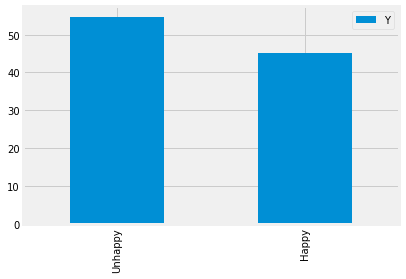

In [7]:
data_happiness_count.plot.bar()

In [8]:
# Check for Null values in the dataset
data_null_values = data.isnull().values.any()
if data_null_values:
    print("There is null values in the dataset.")
else:
    print("There is no null values in the dataset.")

There is no null values in the dataset.


In [9]:
X = data.drop("Y",axis =1)
y = data["Y"]

In [10]:
X.shape,y.shape

((126, 6), (126,))

In [11]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0,stratify=y)

In [12]:
print('The Variance Threshold is a feature selector that removes all low-variance features. In our case, all of the six features have a variance higher than the threshold 0.1.')

The Variance Threshold is a feature selector that removes all low-variance features. In our case, all of the six features have a variance higher than the threshold 0.1.


In [13]:
constant_filter = VarianceThreshold(threshold=0.1)
constant_filter.fit(X_train)
X_train_filter = constant_filter.transform(X_train)
X_test_filter = constant_filter.transform(X_test)
print( 'After applying the variance threshold feature selector, we still have {} features.'.format(len(X_train_filter[0])))

After applying the variance threshold feature selector, we still have 6 features.


In [14]:
X_train_T = pd.DataFrame(X_train_filter.T)
X_test_T = pd.DataFrame(X_test_filter.T)

In [15]:
# Check for duplicated columns
# If 0, then there is no duplicate columns
# If >= 1, then there is at least 2 duplicated columns
nb_duplicate_columns = X_train_T.duplicated().sum()
print("The Number of duplicate columns is :%5.1f" % (nb_duplicate_columns))

The Number of duplicate columns is :  0.0


## B - Classifiers And Hyperparameters Tuning

In this part, we will present the different classifiers that we will use
in the next sections for model prediction.

* The different classifiers are: 
  <br>
  
  * Random Forest Classifier
  <br>
  
  * Gradient Boosting Classifier
  <br>
  
  * XGBoost Classifier
  <br>
  
  * LightGBM Classifier
  <br>

* We also present the different hyperparameters that we will use for model prediction. In this project we will use a Randomized Search Technique for selecting the best subset of hyperparameters when predictin customer happiness.

In [16]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Learning rate
learning_rate = [0.01, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2]

# Hyperparameters for random forest classifier
params_grid_rf = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap
}


# Hyperparameters for gradient boosting classifier
params_grid_gb = {
    'n_estimators':n_estimators,
    'learning_rate': learning_rate,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'max_depth': max_depth,
    'max_features':max_features
}


# Hyperparameters for xgboost classifier
params_grid_xgb = {
    'n_estimators':n_estimators,
    'learning_rate': learning_rate,
    'max_depth': max_depth
}


# Hyperparameters for lightgbm classifier
params_grid_lgbm = {
    'n_estimators':n_estimators,
    'learning_rate': learning_rate,
    'max_depth': max_depth
}

* Usually, we only have a vague idea of the best hyperparameters and thus the best approach to narrow our search is to evaluate a wide range of values for each hyperparameter. Using Scikit-Learn’s RandomizedSearchCV method, we can define a grid of hyperparameter ranges, and randomly sample from the grid, performing K-Fold CV with each combination of values.

In [17]:
def best_model(X_train,y_train,estimator,params_grid):
    """
    best_model performs a randomized search technique to first select the best
    estimator in terms of hyperparameters and
    return the fitted (optimized) model

    :param X_train: training dataset for features variables
    :param y_train: training dataset for target variable
    :param estimator: estimator used in the randomized search technique
    :param params_grid: grid for hyperparameters
    :return: the fitted estimator.
    """ 
    clf = RandomizedSearchCV(estimator = estimator,
                             param_distributions = params_grid,
                             n_iter = 10,
                             cv = 3,
                             verbose=0,
                             random_state=42,
                             n_jobs = -1)
    clf.fit(X_train,y_train)  
    best_model_ = clf.best_estimator_
    return best_model_
    

In [18]:
def accuracy_model(model,X_test,y_test):
    """
    accuracy_model predict the target values on the test dataset
    and calculates the accuracy on the test set.

    :param model: fitted estimator with best hyperameters
    :param X_test: test dataset for feature variables
    :param y_test: test dataset for target_variable
    :return: describe what it returns
    """ 
    
    y_pred = model.predict(X_test)
    return accuracy_score(y_test,y_pred)

In [19]:
# List of classifiers used for model prediction
classifiers = ['XGB','RF','GB','LightGBM']

## C - Feature Selection based on Statistical Tests and Prediction based on Classifiers.

* In this section, we will present the three statistical tests used for feature selection and then perform prediction. 

### Helper Functions

In [20]:
def p_values_threshold(sel,threshold):
    """
    p_values_threshold select the p_values
    of the features and select only the one
    with a p_value lower than the threshold

    :param sel: results of statistical tests where
            sel[1] corresponds to the p_values
            and sel[0] to the values of the statistic.
    :param threshold: threshold for filtering
    :return: p_values filtered
    """
    
    p_values = pd.Series(sel[1])
    p_values.index = X_train.columns
    p_values.sort_values(ascending=True,inplace=True) 
    p_values = p_values[p_values < threshold]    
    return p_values    

In [21]:
def reduce_features(sel,X_train,X_test,y_train,threshold):
    """
    reduce_features performs data reduction based on 
    the filtered p_values

    :param sel: results of statistical tests where
            sel[1] corresponds to the p_values
            and sel[0] to the values of the statistic.
    :param threshold: threshold for filtering
    :param X_train: training dataset for features variables
    :param X_test: test dataset for feature variables
    :param y_train: training dataset for target variable
    :param threshold: threshold for filtering
    :return: filtered training and test dataset.
    """
    
    
    p_values = p_values_threshold(sel,threshold)    
    X_train = X_train[p_values.index]
    X_test = X_test[p_values.index]    
    return X_train,X_test

In [22]:
def plot_p_values(p_values):
    """
    plot_p_values plots the p_values.

    :param p_values: p_values
    :return: plot of the p_values
    """
    p_values.plot.bar(figsize=(10,5))    

### 1 - Univariate (ANOVA) Test

* ANOVA means Analysis of Variance, the main purpose of ANOVA is to test if two or more groups differ from each other significantly in one or more characteristics. F-test is another name for ANOVA that only compares the statistical means in groups.
<br>

* Based on above intuition, ANOVA F-Test set up the following Hypnosis Assumption:
<br> 

 * Null Hypothesis H₀ : All categories mean values are same (i.e μA=μB=μC)
 <br>
 
 * Alternative Hypothesis Hₐ : At least one of the categories mean values differ 
 <br> 

* If test result can’t reject H₀, then we need drop the feature.

In [23]:
# First array corresponds to the f-scores and the second array corresponds to the p-values.

# We choose a p-value threshold of 0.05.

# if p-value(f-test) < p-value(threshold) = 0.05, we reject the null hypothesis, and then we keep the feature.

sel_anova = f_classif(X_train,y_train)
print(sel_anova)
X_train_anova,X_test_anova = reduce_features(sel_anova,X_train,X_test,y_train,threshold=0.05)

(array([9.85945477, 0.16094891, 1.225     , 0.25882353, 4.94750693,
       3.708349  ]), array([0.0022335 , 0.6891578 , 0.27109102, 0.61207302, 0.02842328,
       0.05703942]))


In [24]:
X_train_anova.head()

,X1,X5
28,3,3
46,5,4
67,4,4
3,5,3
27,3,3


### 2 - Chi2 Test

* In Feature Selection, we can use Chi-Square independence test to determine if there is dependence between a categorical feature variable and categorical target variable. Chi-Square Dependence Test is a Hypotheses Test, so we set up below two exclusive assumptions:
<br>

* Null Hypothesis H₀ : Assumes there is no dependence between the two variables, the two variables are totally independent
<br>

* Alternative Hypothesis Hₐ: Assumes there is dependence between the two variables
<br>

* A higher value of chi2 statistic means "two categorical variables are dependent (rejection of the null hypothesis) and more useful for classification.

In [25]:
sel_chi = chi2(X_train,y_train)
print(sel_chi)
X_train_chi,X_test_chi = reduce_features(sel_chi,X_train,X_test,y_train,threshold=0.25)

(array([1.1887539 , 0.0802139 , 0.37037037, 0.05200946, 1.62521675,
       0.59753937]), array([0.27558105, 0.77700774, 0.54280245, 0.81960285, 0.20236592,
       0.43951841]))


In [26]:
X_train_chi.head()

,X5
28,3
46,4
67,4
3,3
27,3


### 3 - Mutual Information (MI)

* In statistics, Mutual Information (MI) of two random variables is a measure of the mutual dependence between the two variables. MI is equal to zero if two random variables are independent, and higher values mean higher dependency. We then keep the features that only have a low mutual information with the target variable y.

In [27]:
# The threshold in SelectPercentile corresponds to the number of features to keep based on 
# the sorted mutual information.

def reduce_columns_mi(X_train,X_test,y_train,threshold):  
    
    """
    reduc_columns_mi reduce the features in the training dataset
    based on the mutual information and select
    only a subset based on the threshold.

    :param X_train: training dataset for features variables
    :param X_test: test dataset for feature variables
    :param y_train: training dataset for target variable
    :param threshold: threshold for selecting the features with the highest mutual information
    :return: p_values filtered
    """
    
    sel = SelectPercentile(mutual_info_classif,percentile = threshold).fit(X_train,y_train)
    #X_train.index = X_train.columns[sel.get_support()]
    columns = X_train.columns[sel.get_support()]
    X_train = pd.DataFrame(sel.transform(X_train))
    X_train.columns = columns
    X_test = pd.DataFrame(sel.transform(X_test))
    X_test.columns = columns
    return pd.DataFrame(X_train),pd.DataFrame(X_test)   

In [28]:
# threshold = 50, means that we keep only the 50% features
# that have the higher mutual information with the target variable y.

X_train_mi,X_test_mi = reduce_columns_mi(X_train,X_test,y_train,threshold=50)

In [29]:
X_train_mi.head()

,X1,X5,X6
0,3,3,4
1,5,4,5
2,4,4,4
3,5,3,5
4,3,3,4


### 4 - All statistical tests features selection methods combined

In [30]:
# List of statistical tests
stats_tests = ['ANOVA','Chi2','MI']

* The for loops iterates over the statistical tests presented previously and the 4 clasifiers. It selects the best model by classifier by performing randomized search technique. The results are stored in the results_statistical_tests list. 

In [31]:
results_statistical_tests = []

for test in stats_tests:
    
    if test == 'ANOVA':
        X_train_stats,X_test_stats = X_train_anova,X_test_anova

    if test == 'Chi2':
        X_train_stats,X_test_stats = X_train_chi,X_test_chi

    if test == 'MI':
        X_train_stats,X_test_stats = X_train_mi,X_test_mi
        
    for classifier in classifiers:
        res = []
        
        res.append(classifier)
        res.append(test)
        
        if classifier == 'XGB':
            estimator = XGBClassifier()
            params_grid = params_grid_xgb
            model = best_model(X_train_stats,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_stats,y_test)
        
        if classifier == 'RF' :
            estimator = RandomForestClassifier()
            params_grid = params_grid_rf
            model = best_model(X_train_stats,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_stats,y_test)
        
        if classifier == 'GB':
            estimator = GradientBoostingClassifier()
            params_grid = params_grid_gb
            model = best_model(X_train_stats,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_stats,y_test)
        
        if classifier == 'LightGBM':
            estimator = LGBMClassifier()
            params_grid = params_grid_lgbm
            model = best_model(X_train_stats,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_stats,y_test)
        
        res.append(set(X_train_stats.columns))
        res.append(accuracy)
        
        results_statistical_tests.append(res)       

/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set

In [32]:
# Storing the results in a pandas DataFrame
results_statistical_tests = pd.DataFrame(results_statistical_tests)
results_statistical_tests.columns = ['classifier','feature_selection','features','accuracy']
results_statistical_tests

,classifier,feature_selection,features,accuracy
0,XGB,ANOVA,"{X5, X1}",0.615385
1,RF,ANOVA,"{X5, X1}",0.615385
2,GB,ANOVA,"{X5, X1}",0.615385
3,LightGBM,ANOVA,"{X5, X1}",0.615385
4,XGB,Chi2,{X5},0.615385
5,RF,Chi2,{X5},0.615385
6,GB,Chi2,{X5},0.615385
7,LightGBM,Chi2,{X5},0.615385
8,XGB,MI,"{X6, X5, X1}",0.615385
9,RF,MI,"{X6, X5, X1}",0.615385


### D - Correlation Analysis

* In this section, we perform a correlation analysis for feature selection, and then apply the 4 classifiers for model prediction. In feature selection scenario, we can keep the independant variables which have strong correlation with target variable, and the very low correlation variables are the candidates to be removed.
<br> 

* The Pearson correlation is focus on measuring how well two variables are following linear relationship.
<br> 

* The Spearman’s Rank-Order Correlation Rank order number can be Ordinal Categorical Encoding on variable Bucket or Discrete continuous variable into ordinal number Compare with Pearson correlation, Spearman correlation is insensitive to outliers in variable because it uses ordinal rank order instead of original variable value.
<br>

* The Kendal Rank Correlation is generalized from Spearman correlation, it is more suitable to measure monotonic relationship of two variables.

#### Correlation Matrix

* From the correlation matrix, we can observe that there is no strong correlation between the target variable and the feature variables. The higher correlation is between the feature X1 and Y (0.28). Y is correlated with X1 and X5 and have less correlation with X2 and x4, so we can say that the happiness of clients depends more on the degree of their satisfaction with their courier and also the delivery of orders on time. However, the expectation of content and the good price don't affect a lot on their happiness.

* The highest correlation between features is between the features X1 and X5. Indeed, the fact that the delivery is on time depends on the satisfaction of the customer (the apps makes ordering easy for the customer).

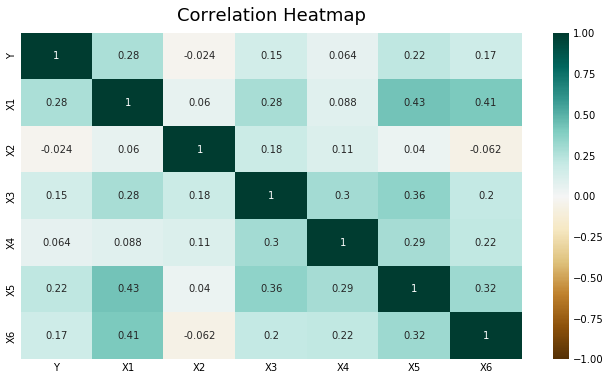

In [33]:
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
# save heatmap as png file
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [34]:
# We calculates the correlation coefficients for each combination of the features and 
# keep only the features that have a correlation coefficient higher than the threshold.
threshold = 0.3
corr_col_pearson_r = set()
corr_col_spearman = set()
corr_col_Kendall = set()
for i in range(len(X_train.columns)):
    for j in range(i):
        coef_pearsonr, p_pearsonr = pearsonr(X_train.iloc[:,i], X_train.iloc[:,j])
        coef_spearman, p_spearman = spearmanr(X_train.iloc[:,i], X_train.iloc[:,j])
        coef_Kendall, p_Kendall = kendalltau(X_train.iloc[:,i], X_train.iloc[:,j])
        
        if coef_pearsonr > threshold:
            corr_col_pearson_r.add(X_train.columns[i])
            corr_col_pearson_r.add(X_train.columns[j])
            
        if coef_spearman > threshold:
            corr_col_spearman.add(X_train.columns[i])
            corr_col_spearman.add(X_train.columns[j])
            
        if coef_Kendall > threshold:
            corr_col_Kendall.add(X_train.columns[i])
            corr_col_Kendall.add(X_train.columns[j])

In [35]:
corr_col_pearson_r,corr_col_spearman,corr_col_Kendall

({'X1', 'X5', 'X6'}, {'X1', 'X3', 'X5', 'X6'}, {'X1', 'X3', 'X5', 'X6'})

In [36]:
X_train_uncorr_pearson_r = X_train.drop(labels=corr_col_pearson_r,axis =1)
X_test_uncorr_pearson_r = X_test.drop(labels=corr_col_pearson_r,axis =1)

In [37]:
X_train_uncorr_spearman = X_train.drop(labels=corr_col_spearman,axis =1)
X_test_uncorr_spearman = X_test.drop(labels=corr_col_spearman,axis =1)

In [38]:
X_train_uncorr_Kendall = X_train.drop(labels=corr_col_Kendall,axis =1)
X_test_uncorr_Kendall = X_test.drop(labels=corr_col_Kendall,axis =1)

In [39]:
# List of correlation methods
correlation_methods = ['pearson_r','spearman','kendall']

* The for loops iterates over the correlation methods presented previously and the 4 clasifiers. It selects the best model by classifier by performing randomized search technique. The results are stored in the results_correlations. 

In [40]:
results_correlations = []

for corr_method in correlation_methods:
    
    if corr_method == 'pearson_r':
        X_train_corr,X_test_corr = X_train_uncorr_pearson_r,X_test_uncorr_pearson_r

    if corr_method == 'spearman':
        X_train_corr,X_test_corr = X_train_uncorr_spearman,X_test_uncorr_spearman

    if corr_method == 'kendall':
        X_train_corr,X_test_corr = X_train_uncorr_Kendall,X_test_uncorr_Kendall
        
    for classifier in classifiers:
        res = []
        
        res.append(classifier)
        res.append(corr_method)
        
        if classifier == 'XGB':
            estimator = XGBClassifier()
            params_grid = params_grid_xgb
            model = best_model(X_train_corr,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_corr,y_test)
        
        if classifier == 'RF' :
            estimator = RandomForestClassifier()
            params_grid = params_grid_rf
            model = best_model(X_train_corr,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_corr,y_test)
        
        if classifier == 'GB':
            estimator = GradientBoostingClassifier()
            params_grid = params_grid_gb
            model = best_model(X_train_corr,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_corr,y_test)
        
        if classifier == 'LightGBM':
            estimator = LGBMClassifier()
            params_grid = params_grid_lgbm
            model = best_model(X_train_corr,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_corr,y_test)
        
        res.append(set(X_train_corr.columns))
        res.append(accuracy)
        
        results_correlations.append(res)

/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set

In [41]:
results_correlations = pd.DataFrame(results_correlations)
results_correlations.columns = ['classifier','feature_selection','features','accuracy']
results_correlations

,classifier,feature_selection,features,accuracy
0,XGB,pearson_r,"{X4, X3, X2}",0.615385
1,RF,pearson_r,"{X4, X3, X2}",0.615385
2,GB,pearson_r,"{X4, X3, X2}",0.653846
3,LightGBM,pearson_r,"{X4, X3, X2}",0.576923
4,XGB,spearman,"{X4, X2}",0.461538
5,RF,spearman,"{X4, X2}",0.384615
6,GB,spearman,"{X4, X2}",0.461538
7,LightGBM,spearman,"{X4, X2}",0.384615
8,XGB,kendall,"{X4, X2}",0.461538
9,RF,kendall,"{X4, X2}",0.461538


### E - Wrapper Methods

In [42]:
#pip install mlxtend --upgrade --no-deps

#### 1 - Illustrative Example for Step Forward Selection - Sequential Forward Selection (SFS)

* SFS remove or add one feature at a time based on the classifier performance until a feature subset of the desired size k is reached, k being the number of features which will be less than the original dimensional feature space, d.

In [43]:
# get the image
Image(url="Capture%20d%E2%80%99e%CC%81cran%202022-08-09%20a%CC%80%2013.37.57.png", width=400, height=400)

In [44]:
sfs = SFS(estimator = XGBClassifier(),
                k_features = 'best',
                forward = True,
                floating = False,
                verbose = 2,
                scoring = 'accuracy',
                cv = 4,
                n_jobs = -1,
                 ).fit(X_train,y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.3s finished

[2022-08-10 22:14:22] Features: 1/6 -- score: 0.64[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished

[2022-08-10 22:14:22] Features: 2/6 -- score: 0.7[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed:    0.1s finished

[2022-08-10 22:14:22] Features: 3/6 -- score: 0.7[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished

[2022-08-10 22:14:22] Features: 4/6 -- score: 0.6699999999999999[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of 

In [45]:
# Features with highest accuracy
sfs.k_feature_names_

('X1', 'X6')

In [46]:
# Accuracy of the best model
sfs.k_score_

0.7

In [47]:
# All combination of features tested 
pd.DataFrame.from_dict(sfs.get_metric_dict()).transpose()

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(0,)","[0.6, 0.64, 0.76, 0.56]",0.64,"(X1,)",0.119956,0.074833,0.043205
2,"(0, 5)","[0.68, 0.68, 0.72, 0.72]",0.7,"(X1, X6)",0.03206,0.02,0.011547
3,"(0, 2, 5)","[0.68, 0.64, 0.68, 0.8]",0.7,"(X1, X3, X6)",0.096179,0.06,0.034641
4,"(0, 2, 3, 5)","[0.64, 0.64, 0.6, 0.8]",0.67,"(X1, X3, X4, X6)",0.123127,0.076811,0.044347
5,"(0, 2, 3, 4, 5)","[0.44, 0.6, 0.56, 0.72]",0.58,"(X1, X3, X4, X5, X6)",0.160298,0.1,0.057735
6,"(0, 1, 2, 3, 4, 5)","[0.52, 0.52, 0.52, 0.72]",0.57,"(X1, X2, X3, X4, X5, X6)",0.138822,0.086603,0.05


#### 2 - Illustrative Example for Step Backward - Sequential Backward Selection (SBS)

* RFE aims to “select features by recursively considering smaller and smaller sets of features.” Essentially this method trains the model on the original number of features, and an importance is given to each feature. The least important features are kicked out, and then the process is repeated to a specified number of features.

In [48]:
# get the image
Image(url="capture%20d%E2%80%99e%CC%81cran%202022-08-09%20a%CC%80%2013.35.03.png", width=400, height=400)

In [49]:
bfs = SFS(estimator = XGBClassifier(),
                k_features = 'best',
                forward = False,
                floating = False,
                verbose = 2,
                scoring = 'accuracy',
                cv = 4,
                n_jobs = -1,
                 ).fit(X_train,y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.3s finished

[2022-08-10 22:14:23] Features: 5/1 -- score: 0.6100000000000001[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.2s finished

[2022-08-10 22:14:23] Features: 4/1 -- score: 0.6400000000000001[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed:    0.1s finished

[2022-08-10 22:14:23] Features: 3/1 -- score: 0.7[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished

[2022-08-10 22:14:23] Features: 2/1 -- score: 0.7[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Do

In [50]:
# Features with highest accuracy
bfs.k_feature_names_

('X1', 'X5', 'X6')

In [51]:
X_train[list(bfs.k_feature_names_)]

,X1,X5,X6
28,3,3,4
46,5,4,5
67,4,4,4
3,5,3,5
27,3,3,4
...,...,...,...
57,4,3,4
39,4,2,4
94,3,1,2
53,5,4,5


In [52]:
# Accuracy of the best model
bfs.k_score_

0.7

In [53]:
# All combination of features tested 
pd.DataFrame.from_dict(bfs.get_metric_dict()).transpose()

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
6,"(0, 1, 2, 3, 4, 5)","[0.52, 0.52, 0.52, 0.72]",0.57,"(X1, X2, X3, X4, X5, X6)",0.138822,0.086603,0.05
5,"(0, 1, 2, 4, 5)","[0.6, 0.56, 0.6, 0.68]",0.61,"(X1, X2, X3, X5, X6)",0.069872,0.043589,0.025166
4,"(0, 1, 4, 5)","[0.56, 0.64, 0.6, 0.76]",0.64,"(X1, X2, X5, X6)",0.119956,0.074833,0.043205
3,"(0, 4, 5)","[0.72, 0.72, 0.64, 0.72]",0.7,"(X1, X5, X6)",0.055529,0.034641,0.02
2,"(0, 5)","[0.68, 0.68, 0.72, 0.72]",0.7,"(X1, X6)",0.03206,0.02,0.011547
1,"(0,)","[0.6, 0.64, 0.76, 0.56]",0.64,"(X1,)",0.119956,0.074833,0.043205


#### 3 - Illustrative example for Exhaustive Feature Selection (Subset Selection) (EFS)

* This exhaustive feature selection algorithm is a wrapper approach for brute-force evaluation of feature subsets; the best subset is selected by optimizing a specified performance metric given an arbitrary classifier. For instance, the alogorithm will evaluate all feature combinations with the number of features between min_features and max_features.

In [54]:
efs = EFS(estimator = XGBClassifier(),
                         min_features = 1,
                         max_features = 6,
                         scoring = 'accuracy',
                         cv = None,
                         n_jobs = -1).fit(X_train,y_train)

Features: 63/63

In [55]:
#Features with highest accuracy.
efs.best_feature_names_

('X1', 'X2', 'X3', 'X4', 'X5', 'X6')

In [56]:
# Accuracy of the best model
efs.best_score_

0.93

In [57]:
# All combination of features tested 
pd.DataFrame.from_dict(efs.get_metric_dict()).transpose()

/usr/local/lib/python3.9/site-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.9/site-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
0,"(0,)",[0.68],0.68,"(X1,)",NaN,0.0,NaN
1,"(1,)",[0.59],0.59,"(X2,)",NaN,0.0,NaN
2,"(2,)",[0.58],0.58,"(X3,)",NaN,0.0,NaN
3,"(3,)",[0.57],0.57,"(X4,)",NaN,0.0,NaN
4,"(4,)",[0.6],0.6,"(X5,)",NaN,0.0,NaN
...,...,...,...,...,...,...,...
58,"(0, 1, 2, 4, 5)",[0.91],0.91,"(X1, X2, X3, X5, X6)",NaN,0.0,NaN
59,"(0, 1, 3, 4, 5)",[0.89],0.89,"(X1, X2, X4, X5, X6)",NaN,0.0,NaN
60,"(0, 2, 3, 4, 5)",[0.87],0.87,"(X1, X3, X4, X5, X6)",NaN,0.0,NaN
61,"(1, 2, 3, 4, 5)",[0.88],0.88,"(X2, X3, X4, X5, X6)",NaN,0.0,NaN


#### 4 - All feature selections methods and classifiers combined

In [58]:
# True : Step Forward Selection - Sequential Forward Selection (SFS)
# False : Step Backward - Sequential Backward Selection (SBS)
# Exhaustive : Exhaustive Feature Selection (Subset Selection) (EFS)
feature_selection_methods = [True,False,'Exhaustive']

* The for loops iterates over the wrapper methods presented previously and the 4 clasifiers. It selects the best model by classifier by performing randomized search technique. The results are stored in the results_wrapper. 

In [59]:
results_wrapper = []

for fs_bool in feature_selection_methods:
    
    if fs_bool == True:
        fs = 'SFS'
        sfs = SFS(estimator = model,
                k_features = 'best',
                forward = fs_bool,
                floating = False,
                verbose = 2,
                scoring = 'accuracy',
                cv = 4,
                n_jobs = -1,
                 ).fit(X_train,y_train)
        best_features = sfs.k_feature_names_        
        X_train_wrapper,X_test_wrapper = X_train[list(sfs.k_feature_names_)],X_test[list(sfs.k_feature_names_)]

    if fs_bool == False:
        fs = 'BFS'
        bfs = SFS(estimator = model,
                k_features = 'best',
                forward = fs_bool,
                floating = True,
                verbose = 2,
                scoring = 'accuracy',
                cv = 4,
                n_jobs = -1,
                 ).fit(X_train,y_train)
        best_features = bfs.k_feature_names_        
        X_train_wrapper,X_test_wrapper = X_train[list(bfs.k_feature_names_)],X_test[list(bfs.k_feature_names_)]

    if fs_bool == 'Exhaustive':
        fs = 'EFS'
        efs = EFS(estimator = model,
                 min_features = 1,
                 max_features = 6,
                 scoring = 'accuracy',
                 cv = None,
                 n_jobs = -1).fit(X_train,y_train)
        best_features = efs.best_feature_names_
        X_train_wrapper,X_test_wrapper = X_train[list(efs.best_feature_names_)],X_test[list(efs.best_feature_names_)]
        
    for classifier in classifiers:
        res = []
            
        res.append(fs)
        res.append(classifier)
        
        
        if classifier == 'XGB':
            estimator = XGBClassifier()
            params_grid = params_grid_xgb
            model = best_model(X_train_wrapper,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_wrapper,y_test)
        
        if classifier == 'RF' :
            estimator = RandomForestClassifier()
            params_grid = params_grid_rf
            model = best_model(X_train_wrapper,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_wrapper,y_test)
        
        if classifier == 'GB':
            estimator = GradientBoostingClassifier()
            params_grid = params_grid_gb
            model = best_model(X_train_wrapper,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_wrapper,y_test)
        
        if classifier == 'LightGBM':
            estimator = LGBMClassifier()
            params_grid = params_grid_lgbm
            model = best_model(X_train_wrapper,y_train,estimator,params_grid)
            accuracy = accuracy_model(model,X_test_wrapper,y_test)
        
        res.append(set(X_train_wrapper.columns))
        res.append(accuracy)
        
        results_wrapper.append(res)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed:    0.5s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.8s finished

[2022-08-10 22:14:25] Features: 1/6 -- score: 0.6799999999999999[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.6s finished

[2022-08-10 22:14:25] Features: 2/6 -- score: 0.6799999999999999[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   4 | elapsed:    0.5s finished

[2022-08-10 22:14:26] Features: 3/6 -- score: 0.67[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished

[2022-08-10 22:14:26] Features: 4/6 -- score: 0.65[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: 

In [60]:
results_wrapper

[['SFS', 'XGB', {'X1'}, 0.5384615384615384],
 ['SFS', 'RF', {'X1'}, 0.5384615384615384],
 ['SFS', 'GB', {'X1'}, 0.5384615384615384],
 ['SFS', 'LightGBM', {'X1'}, 0.5384615384615384],
 ['BFS', 'XGB', {'X1', 'X3'}, 0.5384615384615384],
 ['BFS', 'RF', {'X1', 'X3'}, 0.5384615384615384],
 ['BFS', 'GB', {'X1', 'X3'}, 0.5384615384615384],
 ['BFS', 'LightGBM', {'X1', 'X3'}, 0.5384615384615384],
 ['EFS', 'XGB', {'X1', 'X2', 'X3', 'X5'}, 0.6153846153846154],
 ['EFS', 'RF', {'X1', 'X2', 'X3', 'X5'}, 0.5769230769230769],
 ['EFS', 'GB', {'X1', 'X2', 'X3', 'X5'}, 0.5],
 ['EFS', 'LightGBM', {'X1', 'X2', 'X3', 'X5'}, 0.5384615384615384]]

In [61]:
results_wrapper = pd.DataFrame(results_wrapper)
results_wrapper.columns = ['feature_selection','classifier','features','accuracy']
results_wrapper

,feature_selection,classifier,features,accuracy
0,SFS,XGB,{X1},0.538462
1,SFS,RF,{X1},0.538462
2,SFS,GB,{X1},0.538462
3,SFS,LightGBM,{X1},0.538462
4,BFS,XGB,"{X3, X1}",0.538462
5,BFS,RF,"{X3, X1}",0.538462
6,BFS,GB,"{X3, X1}",0.538462
7,BFS,LightGBM,"{X3, X1}",0.538462
8,EFS,XGB,"{X5, X3, X2, X1}",0.615385
9,EFS,RF,"{X5, X3, X2, X1}",0.576923


### F - Feature Importance

* Feature importances are provided by the fitted attribute feature_importances_ and they are computed as the mean and standard deviation of accumulation of the impurity decrease within each tree.

In [62]:
def forest_importances(model,X_train):
    """
    forest_importances calculates the importance of each
    feature.

    :param model: fitted model 
    :param X_train: train dataset for features
    :return importance of each feature
    """
    fi = pd.Series(model.feature_importances_,index = X_train.columns)
    return fi

In [63]:
def plot_feature_importance(model,name,X_train):
    """
    plot_feature_importance plots the importance of each feature
    for a given classifier.

    :param model: fitted model 
    :param name: name of the classifier
    :param X_train: train dataset for features
    :return plot of importance by feature
    """
    
    importances = model.feature_importances_    
    final_df = pd.DataFrame({"Features": X_train.columns, "Importance":importances})
    final_df.set_index('Importance')
    final_df = final_df.sort_values('Importance')
    plt.figure(figsize=(10,3))
    plt.xticks(rotation=45)
    plt.title("Feature importance " + str(name))
    sns.barplot(x="Features",y= "Importance", data=final_df)

/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set

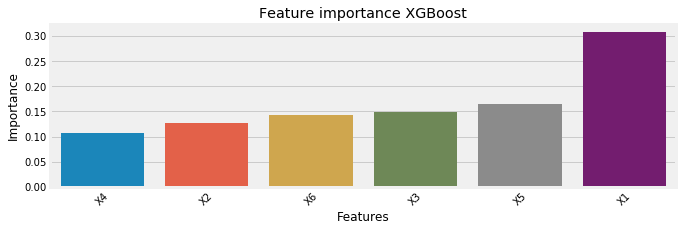

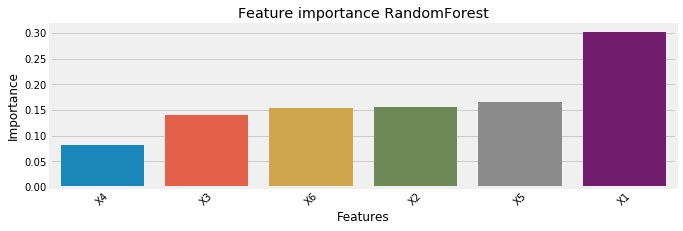

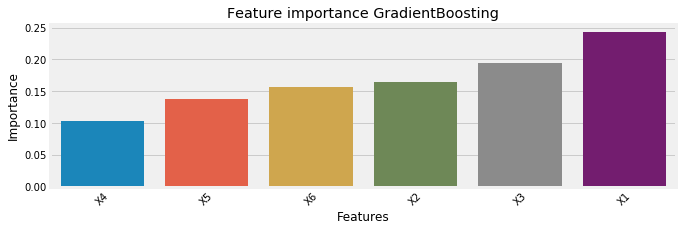

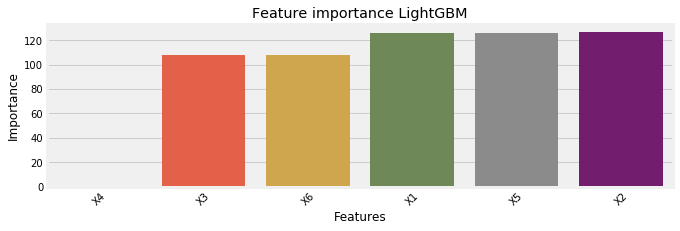

In [64]:
results_fi = []

for classifier in classifiers:
    res = []

    res.append('FI')
    res.append(classifier)

    if classifier == 'XGB':
        estimator = XGBClassifier()
        params_grid = params_grid_xgb
        model = best_model(X_train,y_train,estimator,params_grid)        
        plot_feature_importance(model,'XGBoost',X_train)
        
    if classifier == 'RF' :
        estimator = RandomForestClassifier()
        params_grid = params_grid_rf
        model = best_model(X_train,y_train,estimator,params_grid)        
        plot_feature_importance(model,'RandomForest',X_train)

    if classifier == 'GB':
        estimator = GradientBoostingClassifier()
        params_grid = params_grid_gb
        model = best_model(X_train,y_train,estimator,params_grid)        
        plot_feature_importance(model,'GradientBoosting',X_train)
        
    if classifier == 'LightGBM':
        estimator = LGBMClassifier()
        params_grid = params_grid_lgbm
        model = best_model(X_train,y_train,estimator,params_grid)        
        plot_feature_importance(model,'LightGBM',X_train)
                
    fi = forest_importances(model,X_train)
    
    
    X_train_fi = X_train.drop(fi[fi < 0.1].index.tolist(),axis=1)
    X_test_fi = X_test.drop(fi[fi < 0.1].index.tolist(), axis=1)
    model_fi = best_model(X_train_fi,y_train,estimator,params_grid)
    accuracy = accuracy_model(model_fi,X_test_fi,y_test)

    res.append(set(X_train_fi.columns))
    res.append(accuracy)

    results_fi.append(res)

In [65]:
results_fi = pd.DataFrame(results_fi)
results_fi.columns = ['feature_selection','classifier','features','accuracy']
results_fi

,feature_selection,classifier,features,accuracy
0,FI,XGB,"{X2, X5, X4, X1, X6, X3}",0.615385
1,FI,RF,"{X2, X5, X1, X6, X3}",0.692308
2,FI,GB,"{X2, X5, X4, X1, X6, X3}",0.615385
3,FI,LightGBM,"{X2, X5, X1, X6, X3}",0.538462


### G - All Methdos combined

In [66]:
results = results_statistical_tests.append(results_correlations).append(results_wrapper).append(results_fi)

/var/folders/8t/jz1cthh14w3btj9b6z1dq4z80000gn/T/ipykernel_88488/592787453.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results_statistical_tests.append(results_correlations).append(results_wrapper).append(results_fi)
/var/folders/8t/jz1cthh14w3btj9b6z1dq4z80000gn/T/ipykernel_88488/592787453.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results_statistical_tests.append(results_correlations).append(results_wrapper).append(results_fi)


In [67]:
results = results.sort_values(by=['accuracy'], ascending=False)
results.head()

,classifier,feature_selection,features,accuracy
1,RF,FI,"{X2, X5, X1, X6, X3}",0.692308
11,LightGBM,MI,"{X6, X5, X1}",0.692308
2,GB,pearson_r,"{X4, X3, X2}",0.653846
0,XGB,ANOVA,"{X5, X1}",0.615385
10,GB,MI,"{X6, X5, X1}",0.615385


In [68]:
best_mod = results.iloc[0]
best_mod

classifier                             RF
feature_selection                      FI
features             {X2, X5, X1, X6, X3}
accuracy                         0.692308
Name: 1, dtype: object

In [86]:
print("The best model is {}, where the feature selection method is {}.".format(best_mod.classifier,best_mod.feature_selection))
print('The obtained accuracy is {}.'.format(best_mod.accuracy))

The best model is RF, where the feature selection method is FI.
The obtained accuracy is 0.6923076923076923.


In [75]:
estimator = RandomForestClassifier()
params_grid = params_grid_rf
model = best_model(X_train,y_train,estimator,params_grid) 
fi = forest_importances(model,X_train)
X_test_fi = X_test.drop(fi[fi < 0.1].index.tolist(), axis=1)
model_fi = best_model(X_train_fi,y_train,estimator,params_grid)
accuracy = accuracy_model(model_fi,X_test_fi,y_test)

/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set

* From the plotted confusion matrix, we observe that 7 TN (True negatives)  + 11 TP (True positive) customers are correctly classified (positive for the TP and negative for the TN). However, 5 customers are predicted happy but they are not. Also, 3 customers are classified (predicted) as unhappy but they are happy. The 5 FP (False positive) and 3 FN (False negatives) are the customers that are misclassified by our best model. When evaluating the quality of a model, we want to have a high accuracy but we need other metrics that can take into account the falsely predicted customers. In that sense, just below, we present the precision and recall and calculates them for our best model. 

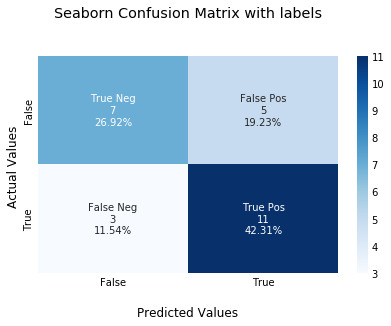

In [104]:
#Generate the confusion matrix
y_pred = model_fi.predict(X_test_fi)
cf_matrix = confusion_matrix(y_test, y_pred)


# Plot the confusion matrix
group_names = ['True Neg','False Pos','False Neg','True Pos']

group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]

labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

* The precision calculates the rate of customers satisfied properly classified among the customers that are predicted as happy. Based on the calculated metric, the precision is 0.69. We wants to have a high value of the precision in order to have much customers satisfied.

* The recall calculates the rate of customers satisfied properly classified among the customers that are happy. Based on the calculated metric, the recall is 0.79.

In [102]:
true_pos = cf_matrix[1][1]
false_pos = cf_matrix[0][1]
false_neg = cf_matrix[1][0]
true_neg = cf_matrix[0][0]

precision = true_pos / (true_pos + false_pos)
recall = true_pos / (true_pos + false_neg)

In [103]:
print("Metrics:")
print(" - acccuracy is {}".format(accuracy))
print(" - Precision is {}".format(precision))
print(" - Recall is {}".format(recall))

Metrics:
 - acccuracy is 0.6923076923076923
 - Precision is 0.6875
 - Recall is 0.7857142857142857
